# Recommendation Sample Run
Sample run of the recommendation pipeline. Uses csv of the clothing catalog to recommend and display an outfit based on the user input.

In [ ]:
%%capture
# Install required packages
!pip install git+https://github.com/huggingface/transformers
!pip install accelerate
!pip install torch
!pip install pandas
!pip install numpy
!pip install huggingface_hub[hf_transfer]

In [ ]:
import pandas as pd
import numpy as np

import os
import random
from PIL import Image as PIL_Image
import tempfile
import io
from pathlib import Path
from IPython.display import Image
from PIL import ImageEnhance
import json
from typing import Union, Dict, List
import re

import torch
from huggingface_hub import hf_hub_download, snapshot_download
from transformers import AutoModelForCausalLM, AutoTokenizer, AutoProcessor

## Create system prompt to use for recommendation
Take the features described in the recognition pipeline to create a catalog of the user's wardrobe to feed into the recommendation LLM.

In [ ]:
def create_detailed_item_description(item: dict, item_id: str) -> str:
    """Create a detailed description of a clothing item using all available information."""
    description_parts = []

    # Start with the ID reference
    description_parts.append(f"[Item {item_id}]")

    # Basic item description
    base_desc = f"{item['Primary Color']} {item['Type of clothing']}"
    if item['Pattern'] != "Solid" and item['Pattern'] != "Not applicable":
        base_desc = f"{item['Pattern']} {base_desc}"
    description_parts.append(base_desc)

    # Rest of the description logic remains the same...
    if item['Style'] not in ["Not specified", "Not applicable"]:
        description_parts.append(f"{item['Style']} style")

    if item['Fabric Material'] not in ["Not specified", "Not applicable"]:
        material_desc = item['Fabric Material']
        if item['Fabric Weight'] not in ["Not specified", "Not applicable"]:
            material_desc = f"{item['Fabric Weight']} {material_desc}"
        description_parts.append(material_desc)

    if item['Fit'] not in ["Not specified", "Not applicable"]:
        description_parts.append(f"{item['Fit']} fit")
    if item['Neckline'] not in ["Not specified", "Not applicable"]:
        description_parts.append(f"{item['Neckline']} neckline")

    if item['Accent Color(s)'] not in ["Not specified", "Not applicable"]:
        description_parts.append(f"with {item['Accent Color(s)']} accents")

    if item['Key design elements'] not in ["Not specified", "Not applicable"]:
        description_parts.append(f"featuring {item['Key design elements']}")

    if item['Functional Features'] not in ["Not specified", "Not applicable"]:
        description_parts.append(f"({item['Functional Features']})")

    if item['Brand'] not in ["Not specified", "Not applicable"]:
        description_parts.append(f"from {item['Brand']}")

    if item['Shape'] not in ["Not specified", "Not applicable"]:
        description_parts.append(f"{item['Shape']} shape")

    if item['Occasion suitability'] not in ["Not specified", "Not applicable"]:
        description_parts.append(f"suitable for {item['Occasion suitability']}")

    if item['Weather appropriateness'] not in ["Not specified", "Not applicable"]:
        description_parts.append(f"suitable for {item['Weather appropriateness']} weather")

    full_description = ", ".join(description_parts)

    extra_info = []
    if item['How it can be styled'] not in ["Not specified", "Not applicable"]:
        extra_info.append(f"Styling suggestions: {item['How it can be styled']}")
    if item['Additional Notes'] not in ["Not specified", "Not applicable"]:
        extra_info.append(f"Note: {item['Additional Notes']}")

    if extra_info:
        full_description += "\n    " + "\n    ".join(extra_info)

    return full_description

def create_outfit_recommendation_prompt(clothing_items: List[str]) -> tuple[str, List[dict]]:
    # Parse each JSON string into a dictionary and create ID mapping
    items = []

    for idx, item_str in enumerate(clothing_items):
        item = json.loads(item_str)
        item_id = f"{idx}"
        items.append(item)

    # Organize by category
    inventory_by_category = {}

    for idx, item in enumerate(items):
        category = item["Category"]
        if category not in inventory_by_category:
            inventory_by_category[category] = []

        item_id = f"{idx}"
        inventory_by_category[category].append(
            create_detailed_item_description(item, item_id)
        )

    # Create the inventory section
    inventory_text = ""
    for category, items in inventory_by_category.items():
        inventory_text += f"\n{category}:\n"
        for item in items:
            inventory_text += f"- {item}\n"

    # Create the final prompt
    prompt = f"""As a fashion stylist, please create outfit combinations using the following detailed inventory of clothing items. Each item is marked with a unique identifier [Item ###] - please use these identifiers when referring to specific items in your recommendations.

AVAILABLE INVENTORY:
{inventory_text}

INSTRUCTIONS:
1. Only recommend items that are explicitly listed in the inventory above
2. An outfit should always have 1 top, 1 bottom, and 1 footwear item. There can be 0 to 2 outerwear items depending on the occasion and weather.
3. Pay attention to:
   - Weather appropriateness for the requested situation
   - Occasion suitability
   - Color coordination and user color preferences if specified
   - Style consistency with the user's request
4. Provide recommendations in this exact JSON format:
{{
    "Outfit": [1, 2, ...],  // Array of item IDs used in the outfit
    "Explanation": 1-2 concise sentences explaining why these pieces work well together for the requested purpose,
    "Styling Tips": 1-2 concise sentences with styling tips or suggested accessories
}}

FORMAT REQUIREMENTS:
- "Outfit": Array of ID numbers only (without "Item" prefix)
- "Explanation": 1-2 sentences maximum
- "Styling Tips": 1-2 sentences maximum
- Response must be valid JSON
- Only include items from the inventory

The user will provide specific outfit requests. Respond with appropriate outfit combinations that match their request while following the format above."""


    return prompt

In [ ]:
def clean_json_string(json_string):
    # Find the start and end of the valid JSON string
    start_index = json_string.find("{")
    end_index = json_string.rfind("}") + 1
    valid_json_string = json_string[start_index:end_index]
    return valid_json_string

In [ ]:
my_wardrobe = pd.read_csv("/content/drive/MyDrive/MIDS Capstone/my_wardrobe_1.csv")
my_wardrobe.drop(columns=["Unnamed: 0"], inplace=True)
my_wardrobe.head(3)

,image_path,json_string,Category,Type of clothing,Primary Color,Accent Color(s),Pattern,Shape,Fit,Neckline,Key design elements,Brand,Style,Occasion suitability,Weather appropriateness,Fabric Material,Fabric Weight,Functional Features,How it can be styled,Additional Notes
0,/content/drive/MyDrive/MIDS Capstone/my wardro...,"```json\n{\n ""Category"": ""Outerwear"",\n ""Typ...",Outerwear,Shirt Jacket,Lavender,"Blue, Black",Plaid,Structured,Relaxed,Collared,"Buttoned front, two chest pockets, buttoned cuffs",JACQUEMUS,Classic/Traditional,Casual,Cold,Wool Blend,Medium,"Not water-resistant, not moisture-wicking, not...","Paired with jeans and boots for a casual look,...",The plaid pattern and lavender color make this...
1,/content/drive/MyDrive/MIDS Capstone/my wardro...,"```json\n{\n ""Category"": ""Outerwear"",\n ""Typ...",Outerwear,Hoodie,Black,Gold,Text,Standard,Relaxed,Not applicable,"Embroidered logo, drawstrings, front pocket",AllSaints,Minimalist,Casual,Cold,Cotton,Medium,Not specified,Paired with jeans and sneakers for a casual lo...,The hoodie features a clean and modern design ...
2,/content/drive/MyDrive/MIDS Capstone/my wardro...,"```json\n{\n ""Category"": ""Outerwear"",\n ""Typ...",Outerwear,Denim Jacket,Blue,"White, Black",Patchwork with various denim textures and stripes,Structured,Oversized,Not applicable,"Multiple pockets, button closures, decorative ...",Tatsumi,Streetwear,Casual,All-season,Denim,Medium,Not explicitly stated,This denim jacket can be paired with jeans and...,The patchwork design and oversized fit give th...


In [ ]:
clothing_items = [clean_json_string(s) for s in my_wardrobe["json_string"]]
sys_prompt = create_outfit_recommendation_prompt(clothing_items)
print(sys_prompt)

As a fashion stylist, please create outfit combinations using the following detailed inventory of clothing items. Each item is marked with a unique identifier [Item ###] - please use these identifiers when referring to specific items in your recommendations.

AVAILABLE INVENTORY:

Outerwear:
- [Item 0], Plaid Lavender Shirt Jacket, Classic/Traditional style, Medium Wool Blend, Relaxed fit, Collared neckline, with Blue, Black accents, featuring Buttoned front, two chest pockets, buttoned cuffs, (Not water-resistant, not moisture-wicking, not insulated), from JACQUEMUS, Structured shape, suitable for Casual, suitable for Cold weather
    Styling suggestions: Paired with jeans and boots for a casual look, or dressed up with chinos and loafers for a more polished appearance.
    Note: The plaid pattern and lavender color make this jacket versatile for both autumn and winter seasons. Its relaxed fit and structured collar give it a timeless appeal.
- [Item 1], Text Black Hoodie, Minimalist s

## Run Recommendation using Distilled Deepseek Model

In [ ]:
os.environ['HF_HUB_ENABLE_HF_TRANSFER'] = '1'

# Define the model repository ID
repo_id = "deepseek-ai/DeepSeek-R1-Distill-Llama-8B"

# Download the model file using hf_transfer
file_path = snapshot_download(repo_id)

print(f"Model downloaded to: {file_path}")

Fetching 11 files:   0%|          | 0/11 [00:00<?, ?it/s]

model-00002-of-000002.safetensors:   0%|          | 0.00/7.39G [00:00<?, ?B/s]

LICENSE:   0%|          | 0.00/1.06k [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/181 [00:00<?, ?B/s]

model-00001-of-000002.safetensors:   0%|          | 0.00/8.67G [00:00<?, ?B/s]

README.md:   0%|          | 0.00/19.0k [00:00<?, ?B/s]

.gitattributes:   0%|          | 0.00/1.52k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/826 [00:00<?, ?B/s]

figures%2Fbenchmark.jpg:   0%|          | 0.00/777k [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/3.07k [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/24.2k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/9.08M [00:00<?, ?B/s]

Model downloaded to: /root/.cache/huggingface/hub/models--deepseek-ai--DeepSeek-R1-Distill-Llama-8B/snapshots/74fbf131a939963dd1e244389bb61ad0d0440a4d


In [ ]:
model = AutoModelForCausalLM.from_pretrained(
    "deepseek-ai/DeepSeek-R1-Distill-Llama-8B", torch_dtype="auto", device_map="auto"
)

processor = AutoTokenizer.from_pretrained("deepseek-ai/DeepSeek-R1-Distill-Llama-8B")

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

In [ ]:
def rec_pipeline(df, user_prompt):
  # run model
  response = run_one_recommendation(user_prompt)

  # clean output
  rec_output = parse_rec_response(response)

  # display recommended items images, explanation, and styling tips
  display_recommended_items(df, rec_output)


def run_one_recommendation(user_prompt):
  messages = [
      {"role": "system", "content": sys_prompt},
      {"role": "user", "content": user_prompt}
  ]
  text = processor.apply_chat_template(
      messages, tokenize=False, add_generation_prompt=True
  )

  inputs = processor(
      text=[text],
      padding=True,
      return_tensors="pt",
  )

  inputs = inputs.to("cuda")

  # Inference: Generation of the output
  generated_ids = model.generate(**inputs, max_new_tokens=1024)
  generated_ids_trimmed = [
      out_ids[len(in_ids) :] for in_ids, out_ids in zip(inputs.input_ids, generated_ids)
  ]
  output_text = processor.batch_decode(
      generated_ids_trimmed, skip_special_tokens=True, clean_up_tokenization_spaces=False
  )
  return output_text[0]


def parse_rec_response(response):
    # Define regex patterns to extract each component
    outfit_pattern = r"\"Outfit\":\s*(.*)"
    explanation_pattern = r"\"Explanation\":\s*(.*)"
    styling_pattern = r"\"Styling Tips\":\s*(.*)"

    # Extract the components using regex
    outfit_match = re.search(outfit_pattern, response)
    explanation_match = re.search(explanation_pattern, response)
    styling_match = re.search(styling_pattern, response)

    # Check if any match is None and handle it gracefully
    if not outfit_match or not explanation_match or not styling_match:
        raise ValueError("The response format is invalid or does not match the expected pattern.")

    outfit = outfit_match.group(1).strip()
    outfit = outfit.replace("[", "").replace("]", "")[:-1] # remove [] chars and empty str at end index
    outfit = [int(item) for item in outfit.split(',')]
    explanation = explanation_match.group(1).strip()
    styling = styling_match.group(1).strip()

    # Create and return the dictionary
    return {
        "outfit": outfit,
        "explanation": explanation,
        "styling": styling
    }


def display_recommended_items(df, rec_output):
    for i in rec_output["outfit"]:
        item_info = df.iloc[i]
        image_path = item_info["image_path"]
        temp_path = reduce_image_size(image_path)
        display(Image(filename=temp_path))
        os.remove(temp_path)
    print(f"Explanation: {rec_output['explanation']}")
    print(f"Styling Tips: {rec_output['styling']}")


def reduce_image_size(image_path, scale=16, interpolation=PIL_Image.LANCZOS):
    img = PIL_Image.open(image_path)

    enhancer = ImageEnhance.Contrast(img)
    contrast_enhanced = enhancer.enhance(1.5) # Increase contrast by 50%
    enhancer = ImageEnhance.Color(contrast_enhanced)
    color_enhanced = enhancer.enhance(1.3) # Increase saturation by 30%

    # Convert to RGB if necessary
    if img.mode != 'RGB':
        img = img.convert('RGB')

    # Get original dimensions
    width, height = img.size

    # Calculate new dimensions
    new_width = width // scale
    new_height = height // scale

    # Resize the image using the specified interpolation method
    resized_img = color_enhanced.resize((new_width, new_height), interpolation)

    # Create a temporary file path
    temp_path = os.path.join(tempfile.gettempdir(), 'resized_image.png')

    # Save the resized image with original color profile and no compression
    resized_img.save(temp_path)

    return temp_path

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


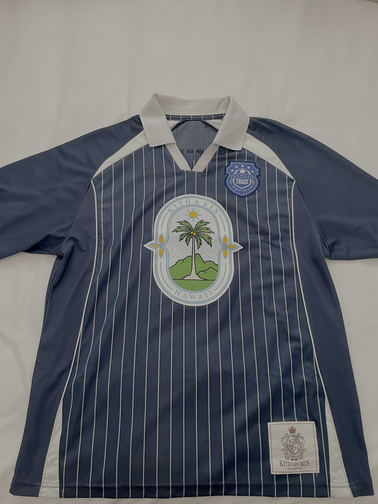

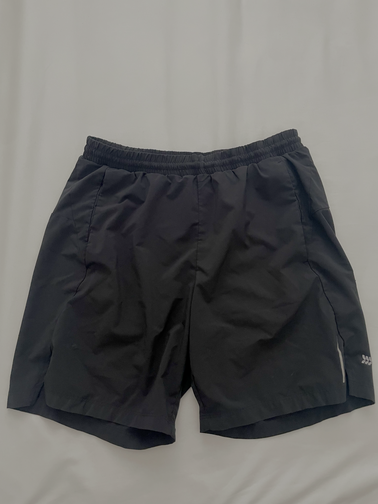

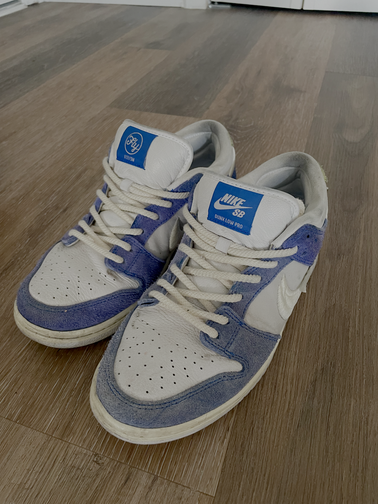

Explanation: "The Vertical Stripes Navy Blue Jersey (Item 10) offers a tropical-inspired design, while the Black Shorts (Item 14) provide both comfort and functionality. The White Sneakers (Item 18) complete the casual, laid-back beach look.",
Styling Tips: "Complete the beach ensemble with a wide-brimmed hat and a colorful beach towel for a chic and functional beach vibe."


In [ ]:
rec_pipeline(my_wardrobe, "I want an outfit for the beach")

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


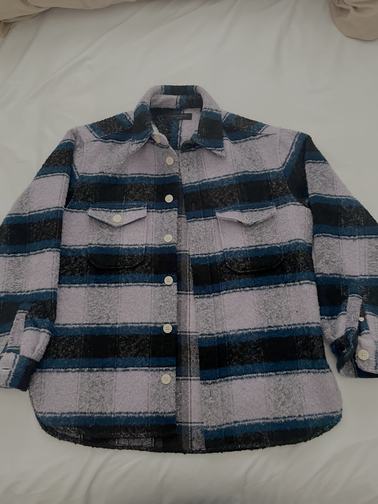

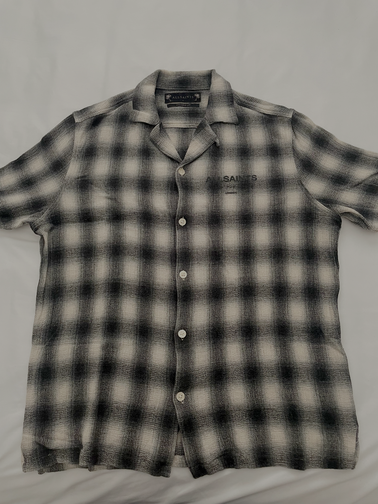

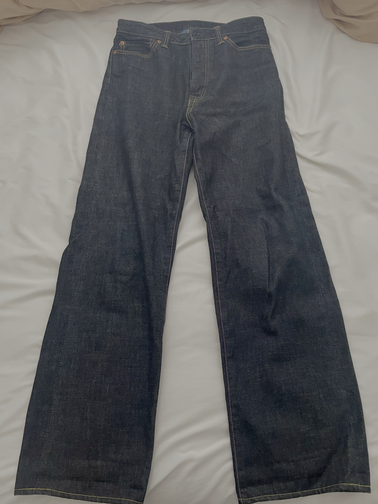

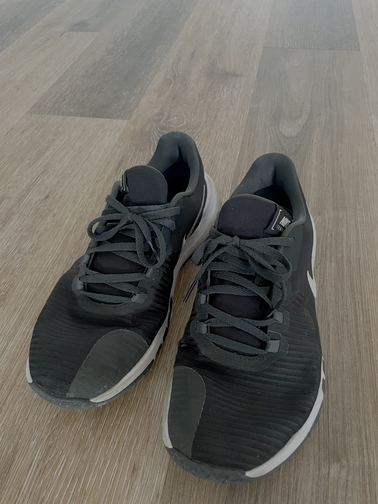

Explanation: "The plaid lavender jacket offers a stylish yet casual look, while the checkered button-up shirt adds a polished touch. The dark blue jeans provide a classic base, and the black running shoes ensure comfort for walking and socializing.",
Styling Tips: "Pair the jacket with the button-up shirt and jeans for a put-together bar look. Add a scarf or a drink in hand for a relaxed, stylish bar vibe."


In [ ]:
rec_pipeline(my_wardrobe, "I want an outfit for going to the bar with a couple friends")

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


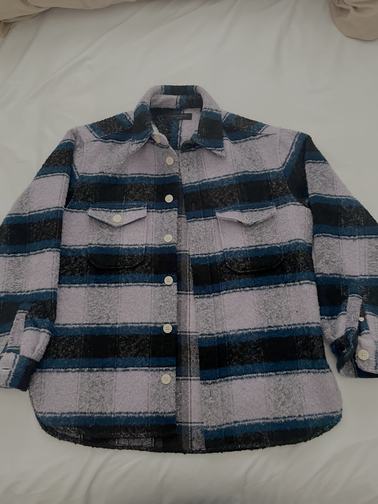

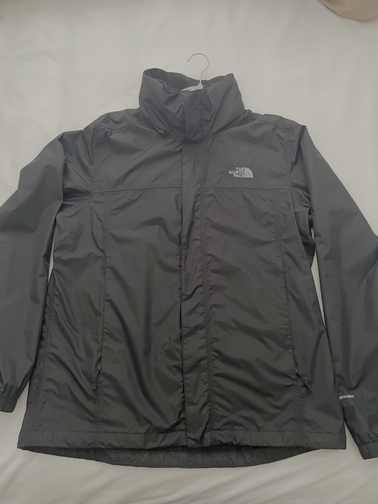

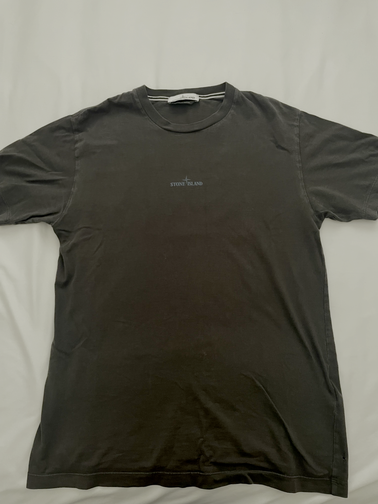

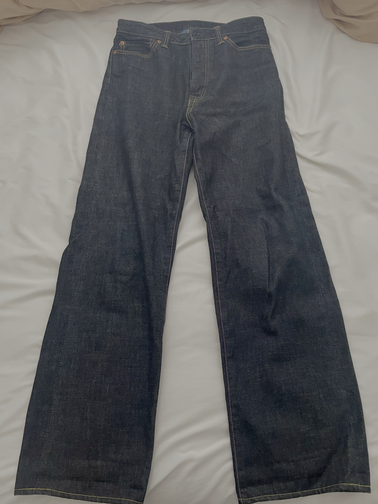

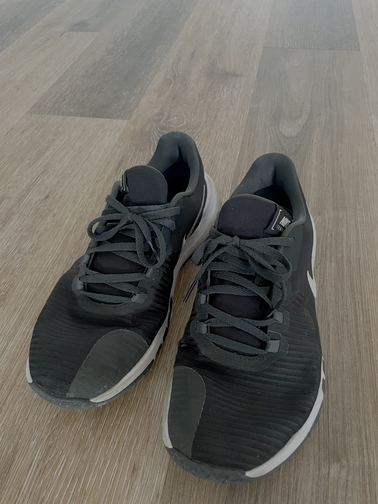

Explanation: "This outfit combines dark tones and versatile pieces for a sleek, modern winter look. The structured plaid jacket and rain jacket provide excellent cold weather protection, while the dark gray t-shirt and dark blue jeans create a cohesive base.",
Styling Tips: "Complete the look with a slim scarf in a neutral color and a beanie for added warmth. Pair this outfit with a leather bag and ankle boots for a polished finish."


In [ ]:
rec_pipeline(my_wardrobe, "I want an outfit an dark tone winter outfit")

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


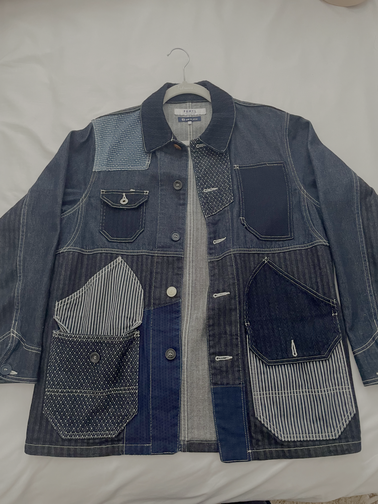

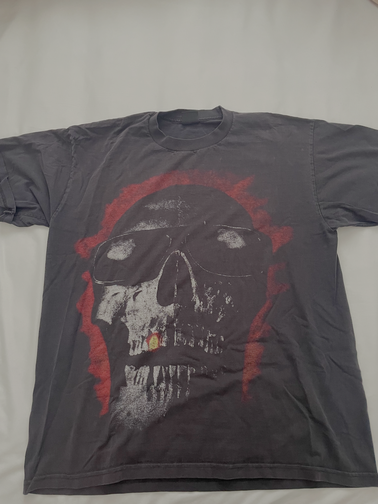

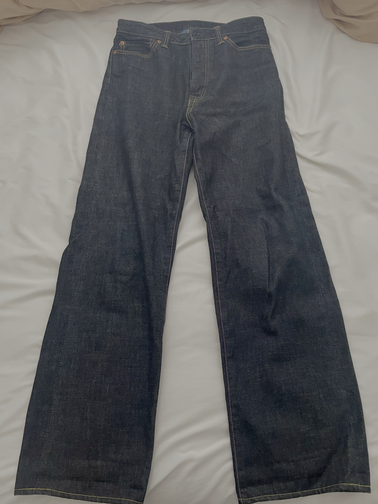

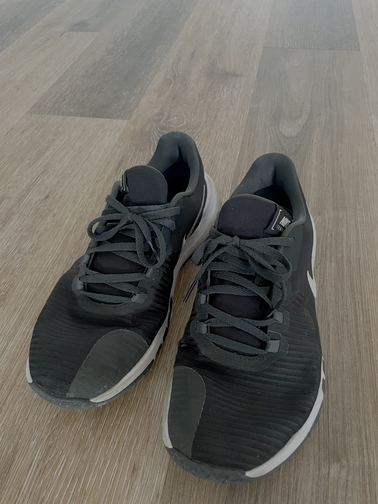

Explanation: "The patchwork denim jacket provides an edgy, streetwear aesthetic, while the skull graphic t-shirt adds a bold statement. The dark blue jeans and black running shoes complete the casual, versatile look.",
Styling Tips: "Pair this outfit with a beanie for an extra layer of warmth and street style. Opt for a sleek backpack or utility belt to enhance the overall vibe."


In [ ]:
rec_pipeline(my_wardrobe, "casual streetwear look")

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


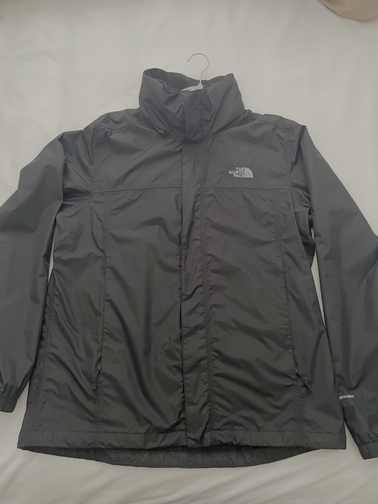

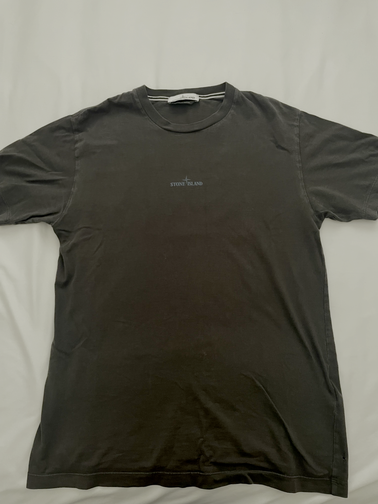

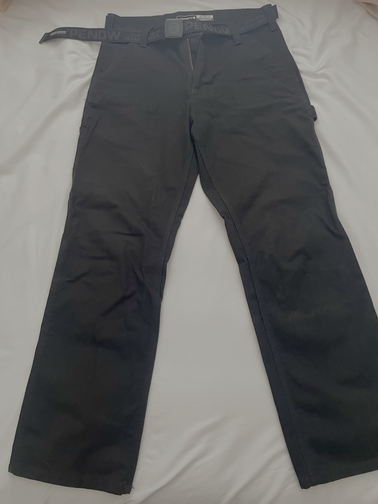

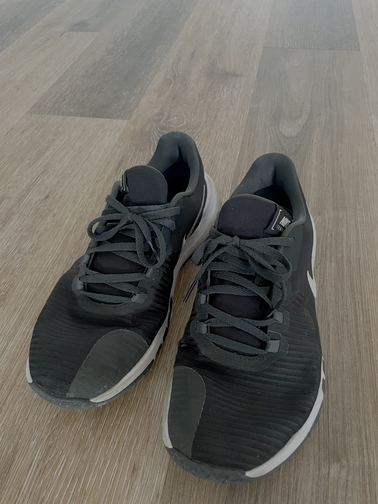

Explanation: "The dark gray rain jacket, paired with the minimalist Stone Island T-shirt, and tailored black pants create a sophisticated look. The Nike running shoes add a sporty edge while maintaining the outfit's polished appearance.",
Styling Tips: "Complete the look with a chic scarf or a sleek crossbody bag for an extra touch of elegance."


In [ ]:
rec_pipeline(my_wardrobe, "something fancy")

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


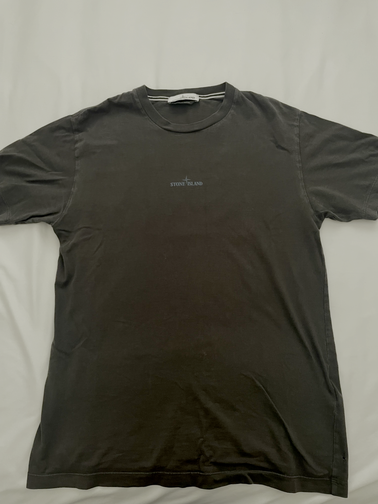

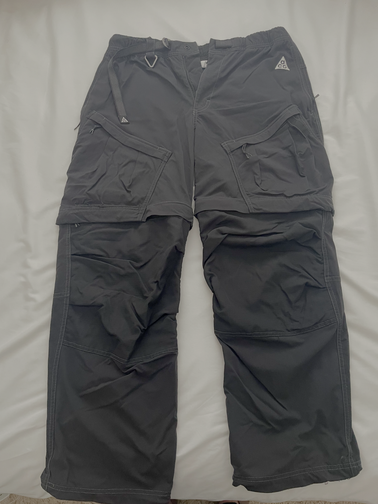

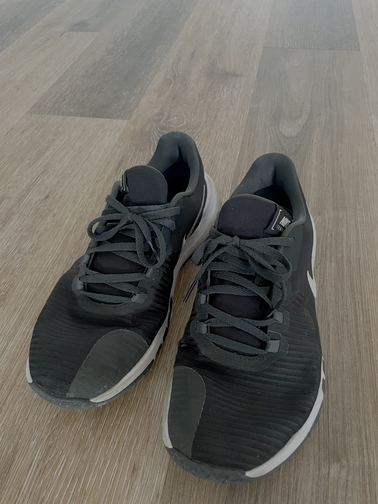

Explanation: "The Dark Gray T-Shirt from Stone Island exudes timeless elegance, while the Dark Gray Cargo Pants provide both comfort and functionality. The Black Running Shoes offer durability and support, making this outfit perfect for a casual yet comfortable day out at 60 degrees.",
Styling Tips: "Complete the look with a lightweight scarf or a beanie for added warmth if needed, or keep it simple with just the outfit for a sleek, minimalistic vibe."


In [ ]:
rec_pipeline(my_wardrobe, "comfortable outfit, 60 degrees (F)")

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


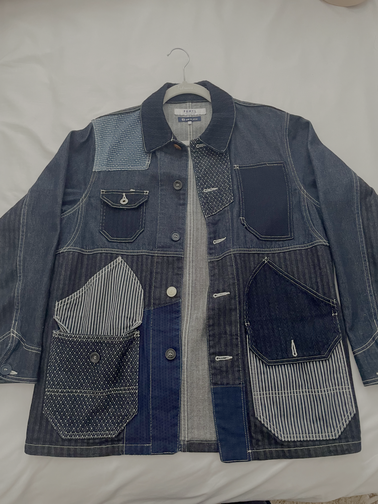

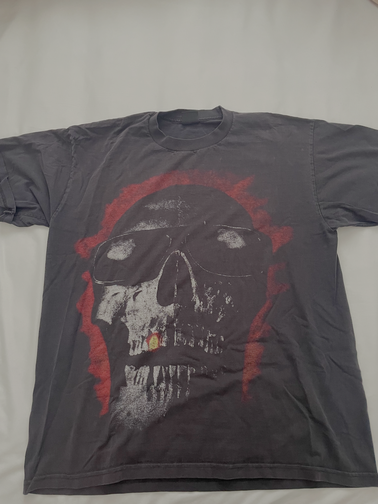

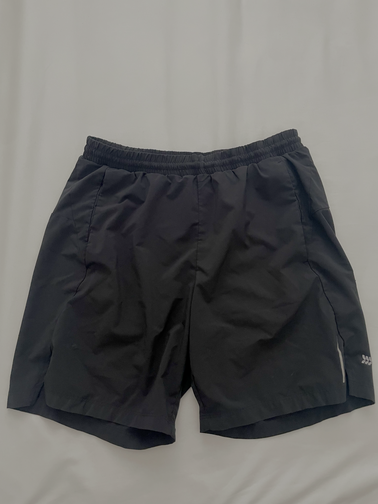

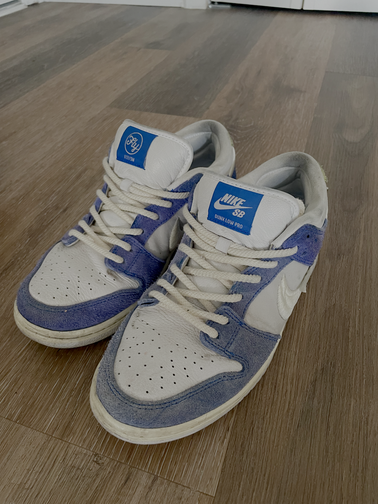

Explanation: "The patchwork denim jacket adds a bold, edgy vibe, while the skull graphic tee provides a striking focal point. The sleek black shorts and vibrant white sneakers complete the look with a pop of color and modern appeal.",
Styling Tips: "Accessorize with a bold necklace or statement hat for extra flair. Opt for a bold lipstick or eye makeup to match the edgy outfit."


In [ ]:
rec_pipeline(my_wardrobe, "hypebeast flashy outfit")

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


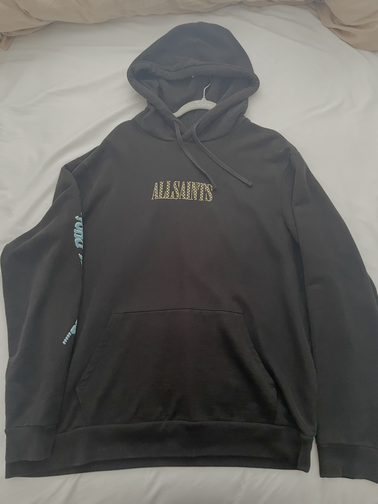

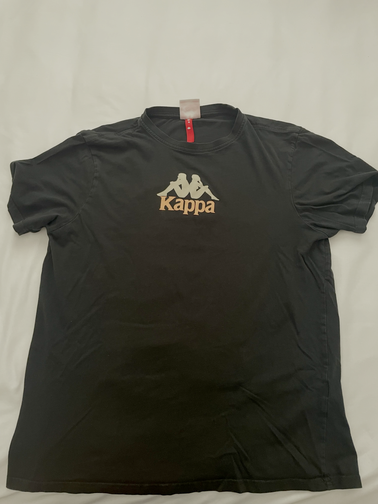

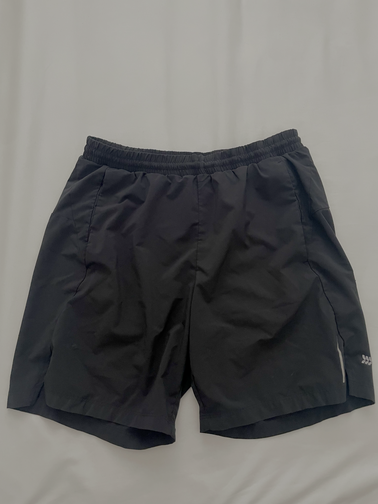

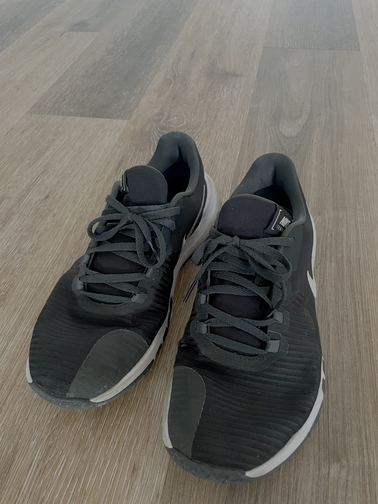

Explanation: "This outfit combines comfort and functionality for a gym setting. The [Item 1] black hoodie provides warmth and a casual style, while the [Item 6] Kappa T-shirt offers a sleek athleisure look. [Item 14] black shorts are both water-resistant and stylish, and [Item 17] running shoes provide cushioned support for workouts.",
Styling Tips: "Layer the [Item 1] hoodie over the [Item 6] T-shirt for a versatile gym look. Complete the outfit with [Item 14] shorts and [Item 17] shoes for a cohesive and functional gym ensemble."


In [ ]:
rec_pipeline(my_wardrobe, "gym outfit")

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


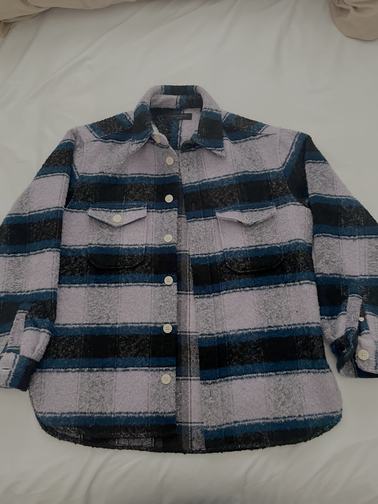

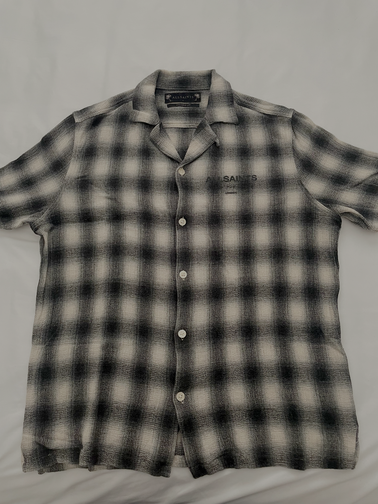

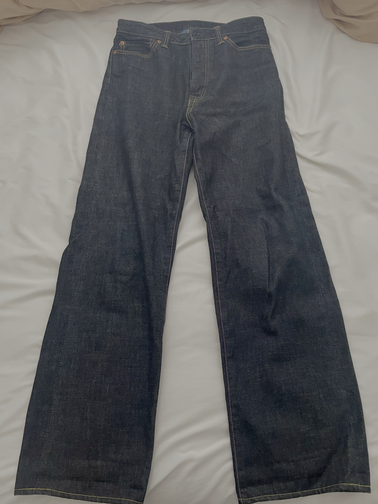

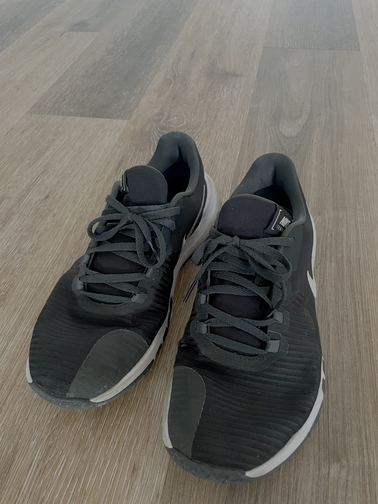

Explanation: "The plaid lavender jacket provides warmth and classic style, while the checkered button-up shirt adds a layer of warmth and a refined look. The dark blue jeans and black running shoes complete the outfit for a cozy and functional day at the park.",
Styling Tips: "Pair the outfit with a colorful scarf for an extra touch of warmth and style. Opt for a lightweight backpack to carry essentials, and consider adding gloves and a hat for added protection against the cold."


In [ ]:
rec_pipeline(my_wardrobe, "snowy day, going to park")

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


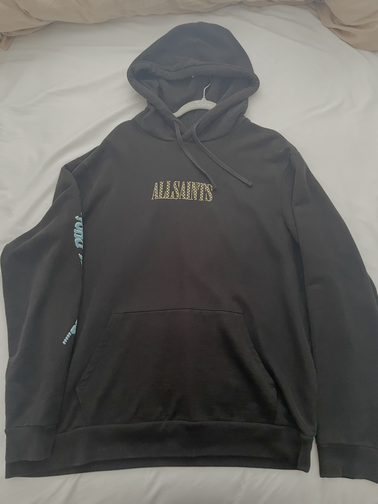

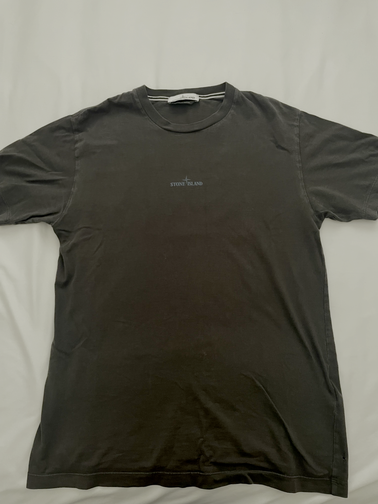

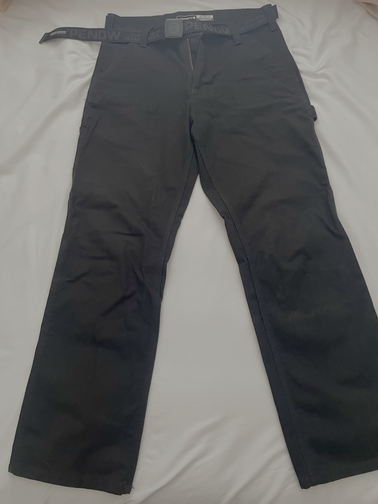

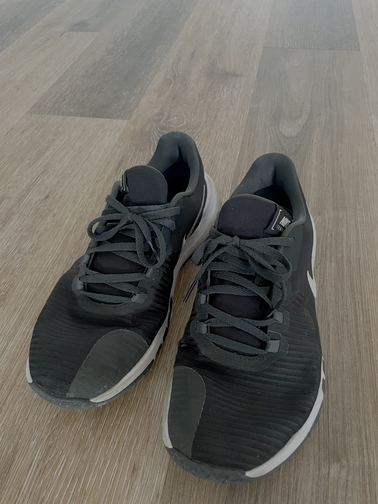

Explanation: "This outfit combines a classic black hoodie, a minimalist graphic tee, tailored black pants, and versatile running shoes for a sleek, casual look. The dark tones and modern designs make it suitable for everyday wear in various weather conditions.",
Styling Tips: "Pair the outfit with a black jacket for an extra layer, or add a statement scarf for a more polished appearance."


In [ ]:
rec_pipeline(my_wardrobe, "all black casual outfit")

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


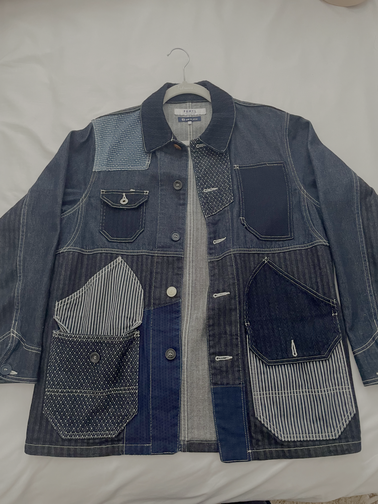

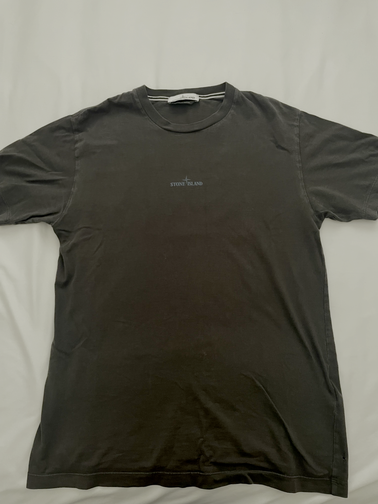

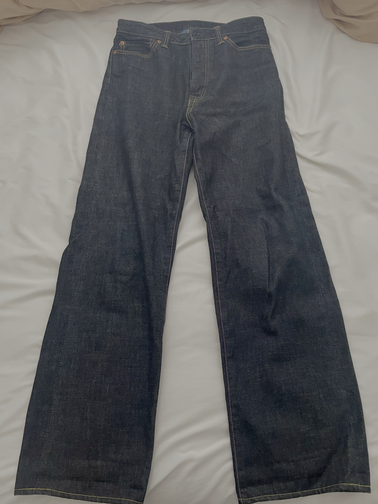

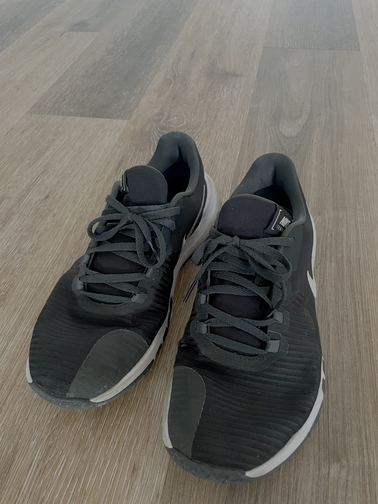

Explanation: "This outfit combines edgy streetwear elements with classic styles. The patchwork denim jacket adds a bold statement, while the minimalist tee and classic jeans provide a balanced base. The running shoes offer both comfort and versatility for various activities.",
Styling Tips: "Pair this outfit with a beanie or cap for a complete streetwear look. Opt for a bold backpack or utility belt to add more edge to the ensemble."


In [ ]:
rec_pipeline(my_wardrobe, "experimental streetwear look")

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


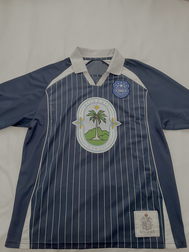

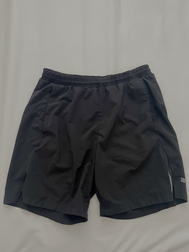

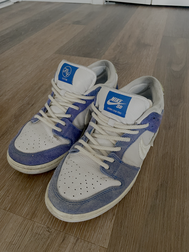

Explanation: "The combination of the Vertical Stripes Navy Blue Jersey, Black Shorts, and White Sneakers creates a stylish and functional beach outfit. The jersey's tropical design and moisture-wicking fabric make it perfect for warm weather, while the shorts and sneakers provide comfort and versatility.",
Styling Tips: "Complete the look with a wide-brimmed hat and a stylish beach bag for a complete beach ensemble."


In [ ]:
rec_pipeline(my_wardrobe, "I want an outfit for the beach")

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


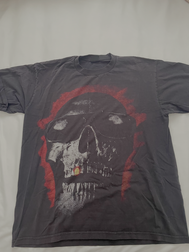

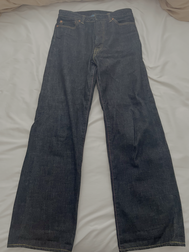

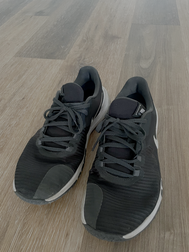

Explanation: "This outfit combines a bold streetwear aesthetic with comfort for a casual café visit. The dark gray t-shirt with the red skull graphic adds a striking contrast, while the dark blue jeans and white sneakers provide a cohesive look.",
Styling Tips: "Complete the look with a lightweight jacket like [Item 5] for a polished streetwear vibe, or opt for a more laid-back feel without it."


In [ ]:
rec_pipeline(my_wardrobe, "going to cafe, streetwear look, 80 degrees (F)")

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


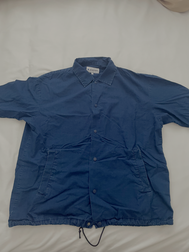

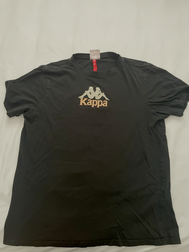

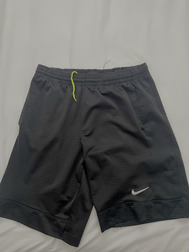

Explanation: "This outfit combines comfort and style for a casual beach day. The denim shirt jacket adds a laid-back vibe, while the grid-patterned shorts provide a modern touch. The white sneakers keep you comfortable and stylish.",
Styling Tips: "Pair with a wide-brimmed hat and oversized sunglasses for a classic beach look. Opt for a sleek backpack to carry your essentials."


In [ ]:
rec_pipeline(my_wardrobe, "outfit for the beach, streetwear, ")

## Observations
More testing is needed to confirm but here are my initial observations:
1. some items seems to rarely be used
2. seems to handle weather inputs pretty well
3. occasion is handled okay (mostly good but recommended running shoes for something fancy)
4. outfit combinations seem to be bit random sometimes / not how I would pair
5. each run takes about 40s on A100. could definitely be sped up

